## Dataset

In [1]:
import xml.etree.ElementTree as ET
import torch
import random
import torchvision.transforms.functional as F
from torch.utils.data import Dataset
from glob import glob
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

class Transforms:
    def __init__(self, subset="train"):
        if subset == "train":
            self.transforms = A.Compose([
                A.HorizontalFlip(p=0.5),
                A.RandomBrightnessContrast(p=0.2),
                A.OneOf([
                A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit= 0.2, 
                                     val_shift_limit=0.2, p=0.9),
                A.RandomBrightnessContrast(brightness_limit=0.2, 
                                           contrast_limit=0.2, p=0.9),
                ],p=0.9),
                A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1,
                                rotate_limit=10, border_mode=0, p=0.5),
                A.Blur(blur_limit=3, p=0.1),
                A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                ToTensorV2(p=1.0)],
                bbox_params=A.BboxParams(
                format="pascal_voc",
                label_fields=["labels"],
                min_area=0,
                min_visibility=0.0
                )
            )
        else:
             self.transforms = A.Compose([A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                                        ToTensorV2(p=1.0)], 
                                        bbox_params=A.BboxParams(
                                        format="pascal_voc",
                                        label_fields=["labels"])
             )
    def __call__(self, image, target):
        image_np = np.array(image)
        h, w = image_np.shape[:2]

        boxes = target["boxes"].clone()
        boxes[:, 0::2] = boxes[:, 0::2].clamp(0, w)
        boxes[:, 1::2] = boxes[:, 1::2].clamp(0, h)
        boxes_list = boxes.tolist() 
        labels_list = target["labels"].tolist()

        if len(boxes_list) == 0:
            transformed_image = ToTensorV2()(image=image_np)["image"]
            target["boxes"] = torch.zeros((0, 4), dtype=torch.float32)
            target["labels"] = torch.zeros((0,), dtype=torch.int64)
            target["area"] = torch.zeros((0,), dtype=torch.float32)
            target["iscrowd"] = torch.zeros((0,), dtype=torch.int64)
            return transformed_image, target

        transformed = self.transforms(image=image_np, bboxes=boxes_list, labels=labels_list)

        new_boxes = torch.tensor(transformed["bboxes"], dtype=torch.float32)
        new_labels = torch.tensor(transformed["labels"], dtype=torch.int64)

        if new_boxes.numel() > 0:
            new_boxes[:, 0::2] = new_boxes[:, 0::2].clamp(0, w)
            new_boxes[:, 1::2] = new_boxes[:, 1::2].clamp(0, h)
            widths = new_boxes[:, 2] - new_boxes[:, 0]
            heights = new_boxes[:, 3] - new_boxes[:, 1]
            valid_mask = (widths > 0) & (heights > 0)
            new_boxes = new_boxes[valid_mask]
            new_labels = new_labels[valid_mask]

        area = (new_boxes[:, 2] - new_boxes[:, 0]) * (new_boxes[:, 3] - new_boxes[:, 1])
        target["boxes"] = new_boxes
        target["labels"] = new_labels
        target["area"] = area
        target["iscrowd"] = torch.zeros((len(new_boxes),), dtype=torch.int64)

        return transformed["image"], target

        

class DetecionDataset(Dataset):
    def __init__(self, root, classes, subset="train", transforms=None):
        self.root = root
        self.subset = subset
        self.classes_to_id = {class_name: i for i, class_name in enumerate(classes)}
        self.transforms = transforms
        
        self.xml_files = sorted(glob(f"{root}/{subset}/annotations/*.xml"))
        self.img_files = sorted(glob(f"{root}/{subset}/images/*.png"))
        
    def __len__(self):
        return len(self.img_files)
    
    def __getitem__(self, idx):
        xml_file = self.xml_files[idx]
        img_file = self.img_files[idx]
        
        image = Image.open(img_file).convert("RGB")
        tree = ET.parse(xml_file)
        boxes = []
        labels = []
        
        for obj in tree.findall("object"):
            cls_name = obj.find("name").text
            cls_id = self.classes_to_id[cls_name]

            bnd = obj.find("bndbox")
            xmin = float(bnd.find("xmin").text)
            ymin = float(bnd.find("ymin").text)
            xmax = float(bnd.find("xmax").text)
            ymax = float(bnd.find("ymax").text)

            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(cls_id)
        
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)
        
        if boxes.numel() == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            area = torch.zeros((0,), dtype=torch.float32)
        else:
            area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
            
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)
        image_id = torch.tensor([idx])
        
        target = {
            "boxes": boxes,
            "labels": labels,
            "area": area,
            "iscrowd": iscrowd,
            "image_id": image_id,
        }
        original_box_count = len(boxes)
        
        if self.transforms is not None:
            image, target = self.transforms(image, target)
        
        if original_box_count == 0:
            return image, target
        
        if len(target["boxes"]) == 0:
            return self.__getitem__(random.randint(0, len(self) - 1))
        
        return image, target
    
    @staticmethod
    def collate_fn(batch):
        images = [item[0] for item in batch]
        targets = [item[1] for item in batch]
        return images, targets


## Utils

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
from torch.utils.data import DataLoader
from torchvision import transforms
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_dataloaders(
    root="../data",
    classes=["background", "with_mask", "without_mask", "mask_weared_incorrect"],
    model_path="../models/fasterrcnn_resnet50_pretrain.pth",
    batch_size=16,
    num_worker=4,
    device='cpu',
    freeze_backbone=True
):
    transforms = {s: Transforms(subset=s) for s in ["train", "valid"]}
    
    dataset = {
        s: DetecionDataset(
            root=root, 
            classes=classes, 
            subset=s, 
            transforms=transforms[s]
        ) 
        for s in ["train", "valid"]
    }
    
    loader = {
        s: DataLoader(
            dataset=dataset[s], 
            batch_size=batch_size, 
            num_workers=num_worker, 
            collate_fn=dataset[s].collate_fn
        )
        for s in ["train", "valid"]
    }
    
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=None)
    
    if freeze_backbone:
        for param in model.backbone.parameters():
            param.requires_grad = False
    
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    num_classes = len(classes)
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    if model_path is not None:
        pretrained_dict = torch.load(model_path, map_location=device)
        model_dict = model.state_dict()
        pretrained_dict = {k: v for k, v in pretrained_dict.items() 
                           if k in model_dict and "box_predictor" not in k}
        model_dict.update(pretrained_dict)
        model.load_state_dict(model_dict)
    
    model.to(device)
    
    return dataset, loader, model
        
def show_image_with_boxes(img_tensor, target, class_names, mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)):
    
    img = img_tensor.clone()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = img.permute(1, 2, 0)  
    img = img.clamp(0, 1).cpu().numpy()
    
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)
    
    boxes = target["boxes"]
    labels = target["labels"]
    scores = target["scores"]
    
    for i, box in enumerate(boxes):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle(
            (xmin, ymin), width, height,
            linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        label = class_names[labels[i]]
        score = scores[i]
        ax.text(xmin, ymin-5, f"{label} {score*100:.2f}%", color='yellow', fontsize=12, 
                bbox=dict(facecolor='red', alpha=0.5, pad=0))
    
    plt.axis('off')
    plt.show()
 
def train_model(model, dataloader_dict, dataset_dict, optimizer, num_epochs, device, save_path='../models/fasterrcnn_resnet50_finetune.pth'):
    Loss_train, Loss_val = [], []
    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        print(f"\n🔹 Epoch {epoch+1}/{num_epochs}")

        for phase in ['train', 'valid']:
            model.train()
            running_loss = 0.0
            total_samples = len(dataset_dict[phase])
            loop = tqdm(dataloader_dict[phase], desc=f"{phase.capitalize()} phase", leave=False)

            for images, targets in loop:
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                if phase == 'train':
                    optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    loss_dict = model(images, targets)
                    loss = sum(loss for loss in loss_dict.values())

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * len(images)
                loop.set_postfix({'loss': f'{loss.item():.4f}'})

            epoch_loss = running_loss / total_samples

            if phase == 'train':
                Loss_train.append(epoch_loss)
            else:
                Loss_val.append(epoch_loss)
                if epoch_loss < best_val_loss:
                    best_val_loss = epoch_loss
                    torch.save(model.state_dict(), save_path)
                    print(f"💾 Saved best model (val loss: {best_val_loss:.4f}) to '{save_path}'")

        print(f"✅ Epoch {epoch+1}/{num_epochs} -- "
              f"Train Loss: {Loss_train[-1]:.4f} | Val Loss: {Loss_val[-1]:.4f}")

    print(f"\n🎯 Training complete. Best Val Loss: {best_val_loss:.4f}")
    return Loss_train, Loss_val

def inference(image_path, model, device, score_thresh=0.5):
    model.eval()
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(
            mean=(0.485, 0.456, 0.406),
            std=(0.229, 0.224, 0.225)
        )
    ])
    img = Image.open(image_path).convert("RGB")
    img_tensor = transform(img).to(device)

    with torch.no_grad():
        outputs = model([img_tensor])[0]

    # Filter theo threshold
    keep = outputs["scores"] >= score_thresh
    outputs["boxes"] = outputs["boxes"][keep].cpu().numpy()
    outputs["scores"] = outputs["scores"][keep].cpu().numpy()
    outputs["labels"] = outputs["labels"][keep].cpu().numpy()
    
    show_image_with_boxes(img_tensor, outputs, ["background", "with_mask", "without_mask", "mask_weared_incorrect"])
    

## Training

In [ ]:
classes = ["background", "with_mask", "without_mask", "mask_weared_incorrect"]
device = "cuda:2"
dataset_dict, dataloader_dict, model = get_dataloaders(
    root="../data",
    classes=classes,
    model_path="../models/fasterrcnn_resnet50_pretrain.pth",
    batch_size=8,
    num_worker=8,
    device=device,
    freeze_backbone=False
)

optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.9, weight_decay=5e-4)

Loss_train, Loss_val = train_model(
    model,
    dataloader_dict,
    dataset_dict,
    optimizer,
    device=device,
    num_epochs=40,
    save_path='fasterrcnn_best.pth'
)



🔹 Epoch 1/40


💾 Saved best model (val loss: 0.6621) to 'fasterrcnn_best.pth'
✅ Epoch 1/40 -- Train Loss: 0.6334 | Val Loss: 0.6621

🔹 Epoch 2/40


💾 Saved best model (val loss: 0.6578) to 'fasterrcnn_best.pth'
✅ Epoch 2/40 -- Train Loss: 0.5924 | Val Loss: 0.6578

🔹 Epoch 3/40


💾 Saved best model (val loss: 0.5613) to 'fasterrcnn_best.pth'
✅ Epoch 3/40 -- Train Loss: 0.5676 | Val Loss: 0.5613

🔹 Epoch 4/40


💾 Saved best model (val loss: 0.5561) to 'fasterrcnn_best.pth'
✅ Epoch 4/40 -- Train Loss: 0.5237 | Val Loss: 0.5561

🔹 Epoch 5/40


💾 Saved best model (val loss: 0.4883) to 'fasterrcnn_best.pth'
✅ Epoch 5/40 -- Train Loss: 0.4856 | Val Loss: 0.4883

🔹 Epoch 6/40


💾 Saved best model (val loss: 0.4780) to 'fasterrcnn_best.pth'
✅ Epoch 6/40 -- Train Loss: 0.4580 | Val Loss: 0.4780

🔹 Epoch 7/40


💾 Saved best model (val loss: 0.4596) to 'fasterrcnn_best.pth'
✅ Epoch 7/40 -- Train Loss: 0.4297 | Val Loss: 0.4596

🔹 Epoch 8/40


✅ Epoch 8/40 -- Train Loss: 0.4127 | Val Loss: 0.4683

🔹 Epoch 9/40


💾 Saved best model (val loss: 0.4178) to 'fasterrcnn_best.pth'
✅ Epoch 9/40 -- Train Loss: 0.3975 | Val Loss: 0.4178

🔹 Epoch 10/40


✅ Epoch 10/40 -- Train Loss: 0.3854 | Val Loss: 0.4370

🔹 Epoch 11/40


💾 Saved best model (val loss: 0.4124) to 'fasterrcnn_best.pth'
✅ Epoch 11/40 -- Train Loss: 0.3698 | Val Loss: 0.4124

🔹 Epoch 12/40


✅ Epoch 12/40 -- Train Loss: 0.3750 | Val Loss: 0.4159

🔹 Epoch 13/40


💾 Saved best model (val loss: 0.4064) to 'fasterrcnn_best.pth'
✅ Epoch 13/40 -- Train Loss: 0.3622 | Val Loss: 0.4064

🔹 Epoch 14/40


💾 Saved best model (val loss: 0.3879) to 'fasterrcnn_best.pth'
✅ Epoch 14/40 -- Train Loss: 0.3591 | Val Loss: 0.3879

🔹 Epoch 15/40


✅ Epoch 15/40 -- Train Loss: 0.3549 | Val Loss: 0.3919

🔹 Epoch 16/40


✅ Epoch 16/40 -- Train Loss: 0.3350 | Val Loss: 0.3974

🔹 Epoch 17/40


✅ Epoch 17/40 -- Train Loss: 0.3318 | Val Loss: 0.3933

🔹 Epoch 18/40


💾 Saved best model (val loss: 0.3774) to 'fasterrcnn_best.pth'
✅ Epoch 18/40 -- Train Loss: 0.3286 | Val Loss: 0.3774

🔹 Epoch 19/40


✅ Epoch 19/40 -- Train Loss: 0.3272 | Val Loss: 0.3819

🔹 Epoch 20/40


💾 Saved best model (val loss: 0.3763) to 'fasterrcnn_best.pth'
✅ Epoch 20/40 -- Train Loss: 0.3228 | Val Loss: 0.3763

🔹 Epoch 21/40


✅ Epoch 21/40 -- Train Loss: 0.3140 | Val Loss: 0.4265

🔹 Epoch 22/40


💾 Saved best model (val loss: 0.3698) to 'fasterrcnn_best.pth'
✅ Epoch 22/40 -- Train Loss: 0.3176 | Val Loss: 0.3698

🔹 Epoch 23/40


✅ Epoch 23/40 -- Train Loss: 0.3045 | Val Loss: 0.3877

🔹 Epoch 24/40


💾 Saved best model (val loss: 0.3597) to 'fasterrcnn_best.pth'
✅ Epoch 24/40 -- Train Loss: 0.3037 | Val Loss: 0.3597

🔹 Epoch 25/40


✅ Epoch 25/40 -- Train Loss: 0.2959 | Val Loss: 0.3811

🔹 Epoch 26/40


✅ Epoch 26/40 -- Train Loss: 0.2975 | Val Loss: 0.4073

🔹 Epoch 27/40


💾 Saved best model (val loss: 0.3573) to 'fasterrcnn_best.pth'
✅ Epoch 27/40 -- Train Loss: 0.2941 | Val Loss: 0.3573

🔹 Epoch 28/40


✅ Epoch 28/40 -- Train Loss: 0.2885 | Val Loss: 0.3773

🔹 Epoch 29/40


✅ Epoch 29/40 -- Train Loss: 0.2901 | Val Loss: 0.3579

🔹 Epoch 30/40


✅ Epoch 30/40 -- Train Loss: 0.2887 | Val Loss: 0.3711

🔹 Epoch 31/40


✅ Epoch 31/40 -- Train Loss: 0.2804 | Val Loss: 0.3723

🔹 Epoch 32/40


💾 Saved best model (val loss: 0.3560) to 'fasterrcnn_best.pth'
✅ Epoch 32/40 -- Train Loss: 0.2829 | Val Loss: 0.3560

🔹 Epoch 33/40


💾 Saved best model (val loss: 0.3529) to 'fasterrcnn_best.pth'
✅ Epoch 33/40 -- Train Loss: 0.2784 | Val Loss: 0.3529

🔹 Epoch 34/40


💾 Saved best model (val loss: 0.3351) to 'fasterrcnn_best.pth'
✅ Epoch 34/40 -- Train Loss: 0.2779 | Val Loss: 0.3351

🔹 Epoch 35/40


✅ Epoch 35/40 -- Train Loss: 0.2729 | Val Loss: 0.3612

🔹 Epoch 36/40


✅ Epoch 36/40 -- Train Loss: 0.2685 | Val Loss: 0.3536

🔹 Epoch 37/40


✅ Epoch 37/40 -- Train Loss: 0.2699 | Val Loss: 0.3370

🔹 Epoch 38/40


✅ Epoch 38/40 -- Train Loss: 0.2671 | Val Loss: 0.3547

🔹 Epoch 39/40


✅ Epoch 39/40 -- Train Loss: 0.2597 | Val Loss: 0.3554

🔹 Epoch 40/40


💾 Saved best model (val loss: 0.3320) to 'fasterrcnn_best.pth'
✅ Epoch 40/40 -- Train Loss: 0.2613 | Val Loss: 0.3320

🎯 Training complete. Best Val Loss: 0.3320


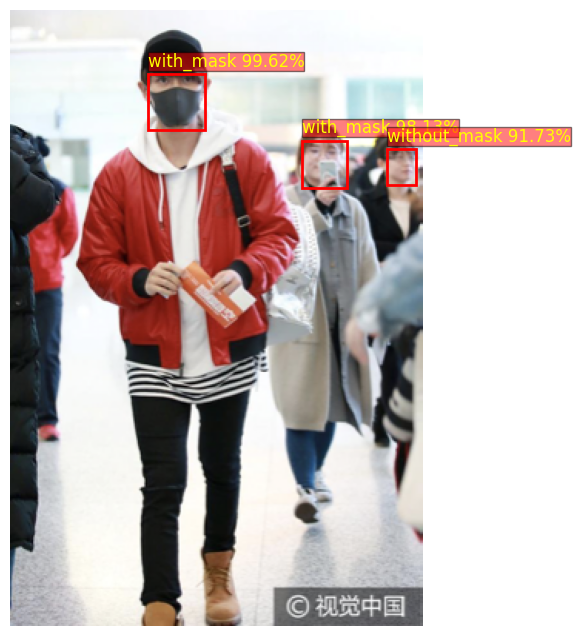

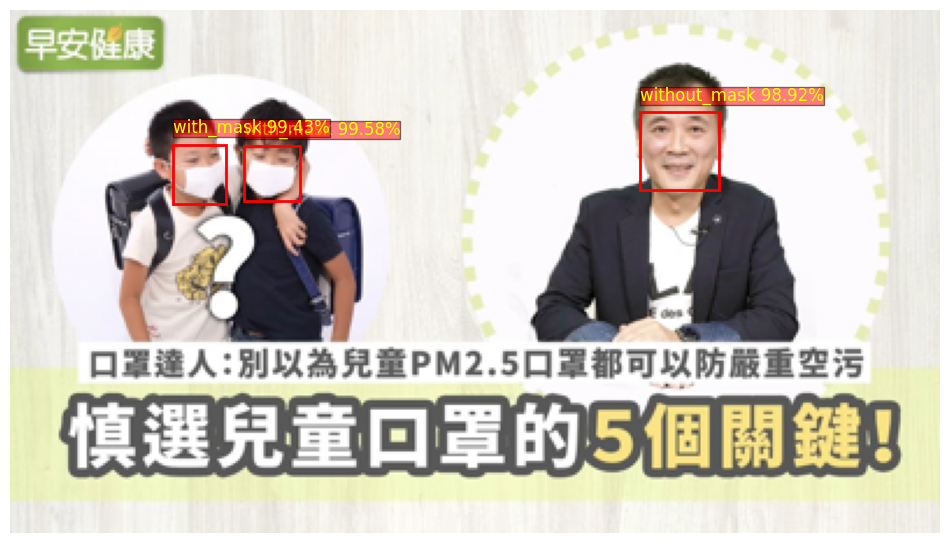

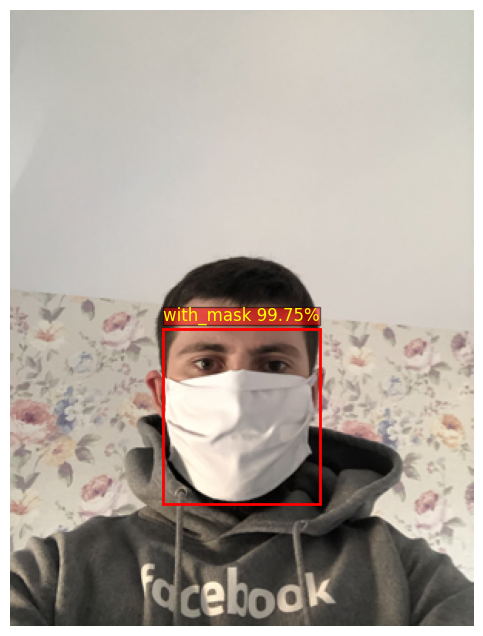

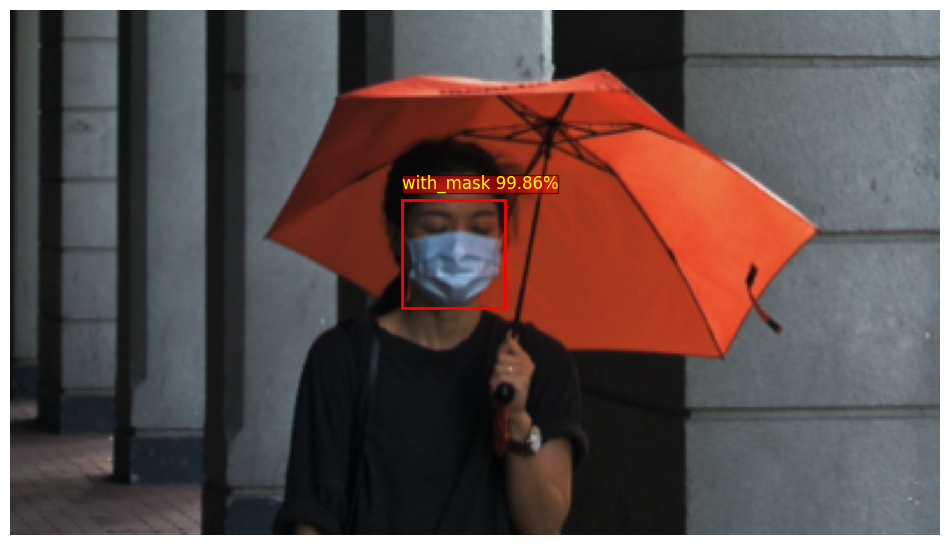

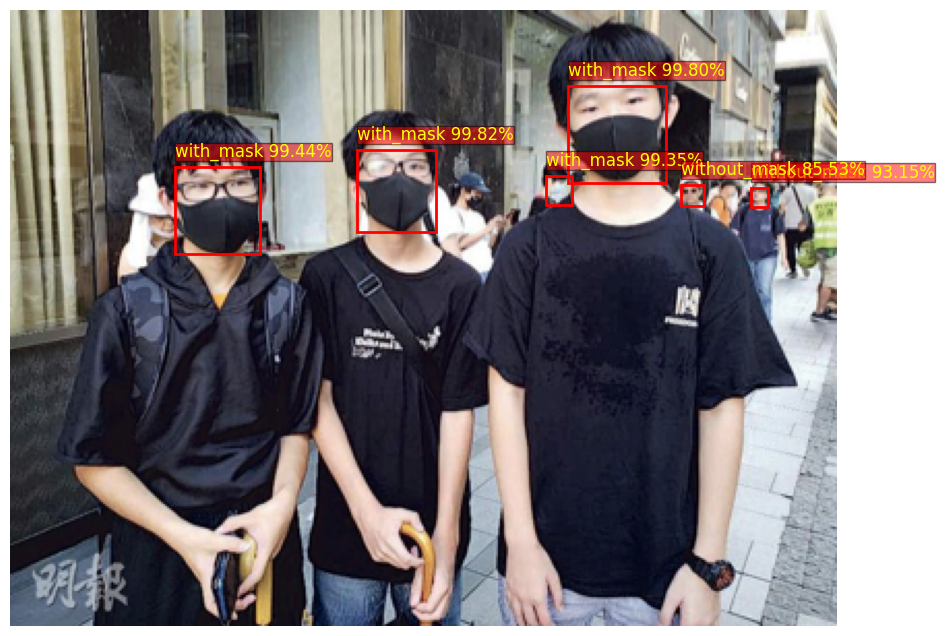

...

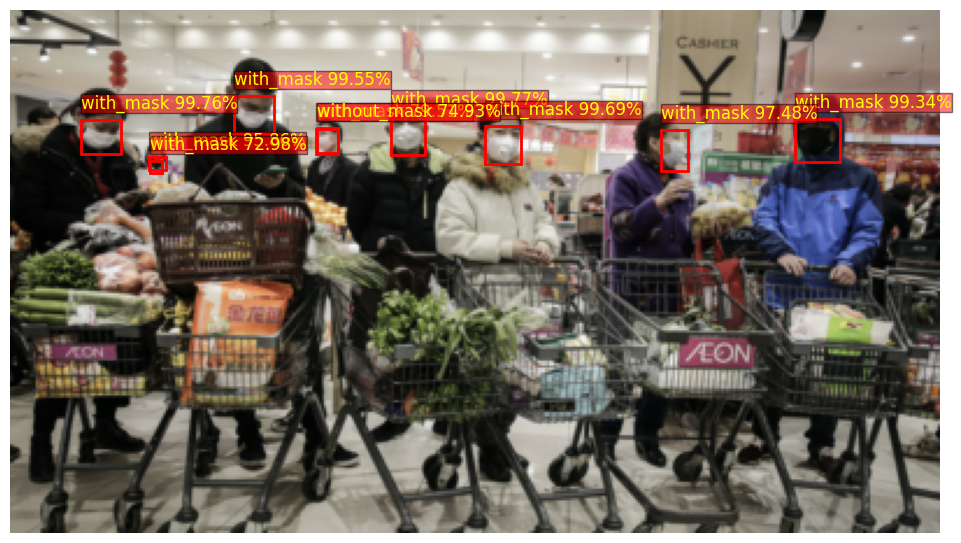

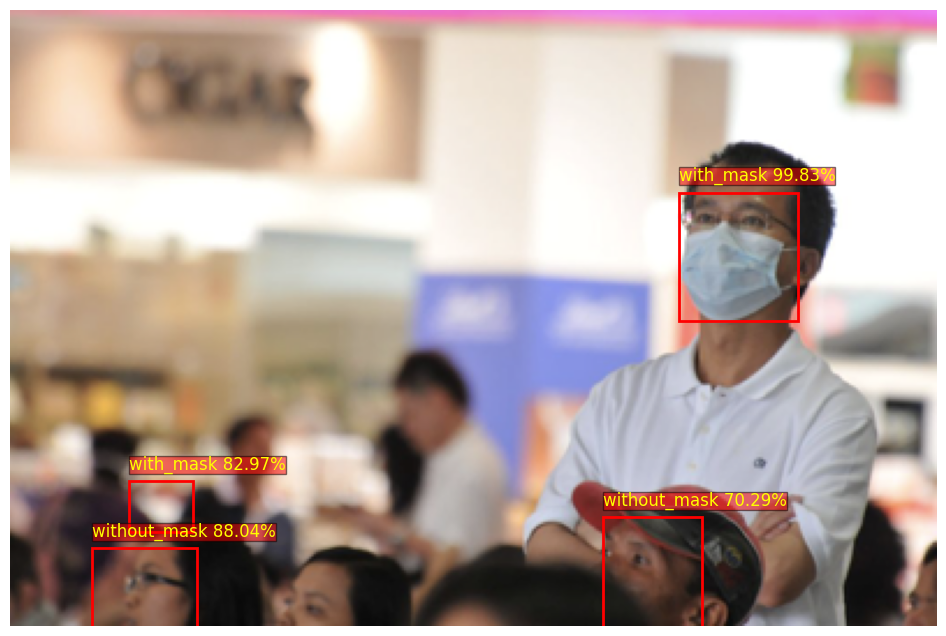

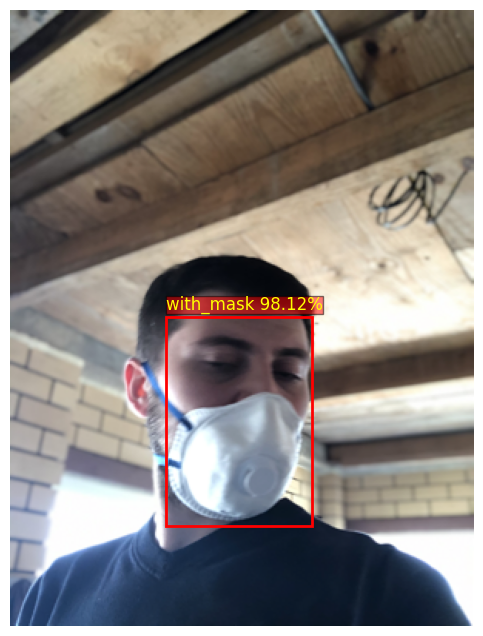

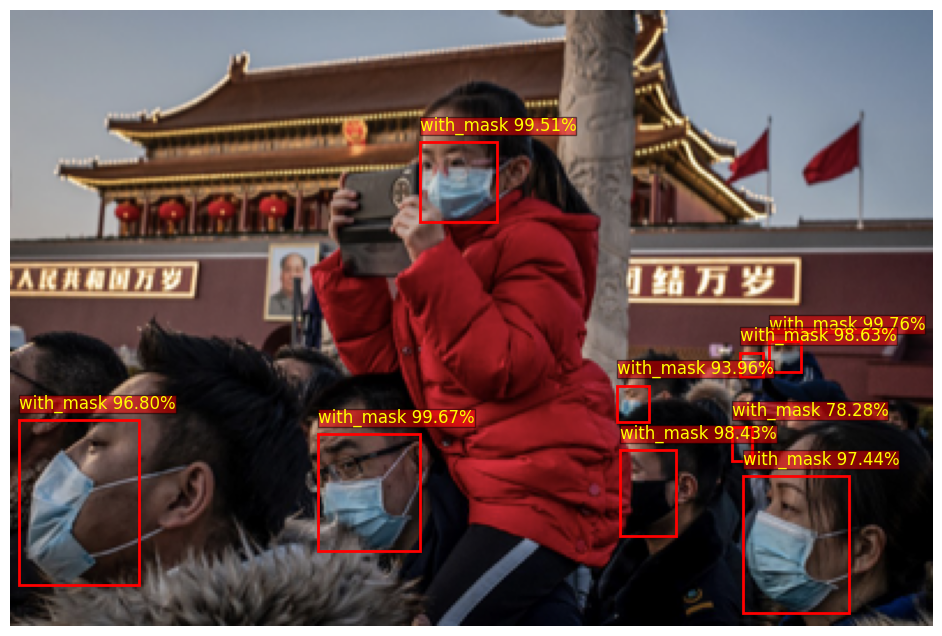

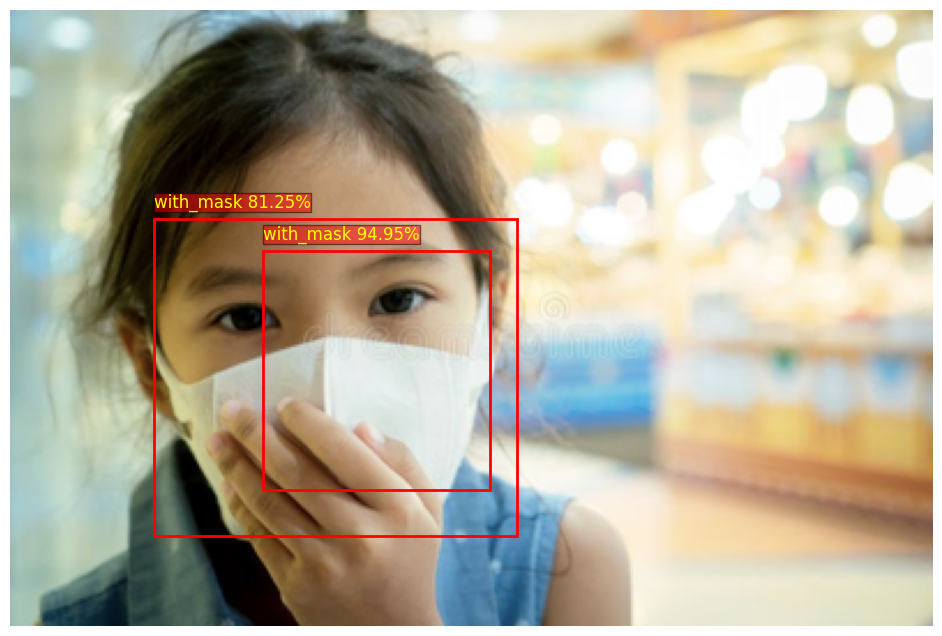

In [4]:
from torchvision import transforms
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=None)
device = "cpu"
in_features = model.roi_heads.box_predictor.cls_score.in_features
num_classes = 4  
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model.load_state_dict(torch.load("../models/fasterrcnn_finetune.pth", map_location=device))
model.to(device)


img_file = sorted(glob(f"../data/valid/images/*.png"))
for file in img_file[20:40]:
    inference(file, model, device, 0.7)